# BANK TERM DEPOSIT ANALYSIS

                                                                                - by Devika,Geethanjali,Prakriti,Sooryajith

The data is related with direct marketing campaigns of a Portuguese banking institution for subscription to term deposit. The marketing campaigns were based on phone calls. Often, more than one contact to the same client was required, in order to access if the product (bank term deposit) was subscribed or not.

Data set has 20 predictor variables (features) and around 41K rows.

The dataset is collected from UCI Repository - "https://archive.ics.uci.edu/ml/datasets/bank+marketing"

A term deposit is a type of deposit account held at a financial institution where money is locked up for some set period of time.Term deposits are usually short-term deposits with maturities ranging from one month to a few years.Typically, term deposits offer higher interest rates than traditional liquid savings accounts, whereby customers can withdraw their money at any time.

# GOAL

Using the data collected from existing customers, we have to build a model that will help the marketing team identify potential customers who are relatively more likely to subscribe to term deposits and thus increase their marketing towards those customers.

Business goal: Reducing marketing resources by identifying customers who would subscribe to term deposit and thereby direct marketing efforts to them.

# Summary

- 1) Data description
- 2) EDA
- 3) Data preprocessing 
- 4) Modelling
- 5) Evaluation

# DATA DESRCIPTION

- age           : age of customer
- job           : type of job 
- marital       : marital status 
- education     : education qualification
- default       : has credit in default? 
- housing       : has housing loan? 
- loan          : has personal loan? 
- contact       : contact communication type 
- month         : last contact month of year 
- dayofweek     : last contact day of the week 
- duration      : last contact duration, in seconds 
- campaign      : number of contacts performed during this campaign and for this client 
- pdays         : number of days that passed by after the client was last contacted from a previous campaign 
- previous      : number of contacts performed before this campaign and for this client 
- poutcome      : outcome of the previous marketing campaign
- emp.var.rate  : employment variation rate - quarterly indicator 
- cons.price.idx: consumer price index - monthly indicator 
- cons.conf.idx : consumer confidence index - monthly indicator 
- euribor3m     : euribor 3 month rate - daily indicator 
- nr.employed   : number of employees - quarterly indicator
- y             : has the client subscribed a term deposit? 

In [1]:
# To install before running on a new laptop ... uncomment when required
#! pip install imblearn
#! pip install xgboost
#! pip install --upgrade scikit-learn
#! pip install plotly

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly
from sklearn.linear_model import LogisticRegression
from imblearn.over_sampling import RandomOverSampler, SMOTE
from imblearn.under_sampling import RandomUnderSampler
from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split, cross_val_score, learning_curve, GridSearchCV, StratifiedKFold, RandomizedSearchCV
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve
from sklearn.metrics import precision_recall_fscore_support as score
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from numpy.random import randint

In [2]:
# Reading a CSV file named "bank-additional-full.csv" into a pandas DataFrame object called 'data'.
data = pd.read_csv("bank-additional-full.csv", sep =";")

In [3]:
# Displays the first 5 rows of data
data.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


# EXPLORATORY DATA ANALYSIS (EDA)

In [4]:
# 41188 rows and 21 attributes
data.shape

(41188, 21)

In [5]:
# Non-graphical Analysis
data.describe(include = 'all').transpose()

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
age,41188.0,NaN,NaN,NaN,40.02406,10.42125,17.0,32.0,38.0,47.0,98.0
job,41188,12,admin.,10422,NaN,NaN,NaN,NaN,NaN,NaN,NaN
marital,41188,4,married,24928,NaN,NaN,NaN,NaN,NaN,NaN,NaN
education,41188,8,university.degree,12168,NaN,NaN,NaN,NaN,NaN,NaN,NaN
default,41188,3,no,32588,NaN,NaN,NaN,NaN,NaN,NaN,NaN
housing,41188,3,yes,21576,NaN,NaN,NaN,NaN,NaN,NaN,NaN
loan,41188,3,no,33950,NaN,NaN,NaN,NaN,NaN,NaN,NaN
contact,41188,2,cellular,26144,NaN,NaN,NaN,NaN,NaN,NaN,NaN
month,41188,10,may,13769,NaN,NaN,NaN,NaN,NaN,NaN,NaN
day_of_week,41188,5,thu,8623,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             41188 non-null  int64  
 1   job             41188 non-null  object 
 2   marital         41188 non-null  object 
 3   education       41188 non-null  object 
 4   default         41188 non-null  object 
 5   housing         41188 non-null  object 
 6   loan            41188 non-null  object 
 7   contact         41188 non-null  object 
 8   month           41188 non-null  object 
 9   day_of_week     41188 non-null  object 
 10  duration        41188 non-null  int64  
 11  campaign        41188 non-null  int64  
 12  pdays           41188 non-null  int64  
 13  previous        41188 non-null  int64  
 14  poutcome        41188 non-null  object 
 15  emp.var.rate    41188 non-null  float64
 16  cons.price.idx  41188 non-null  float64
 17  cons.conf.idx   41188 non-null 

In [7]:
data.dtypes

age                 int64
job                object
marital            object
education          object
default            object
housing            object
loan               object
contact            object
month              object
day_of_week        object
duration            int64
campaign            int64
pdays               int64
previous            int64
poutcome           object
emp.var.rate      float64
cons.price.idx    float64
cons.conf.idx     float64
euribor3m         float64
nr.employed       float64
y                  object
dtype: object

In [8]:
data.columns

Index(['age', 'job', 'marital', 'education', 'default', 'housing', 'loan',
       'contact', 'month', 'day_of_week', 'duration', 'campaign', 'pdays',
       'previous', 'poutcome', 'emp.var.rate', 'cons.price.idx',
       'cons.conf.idx', 'euribor3m', 'nr.employed', 'y'],
      dtype='object')

In [9]:
data=data.rename(columns= {"emp.var.rate":"emp_var_rate",
                             "cons.price.idx": "cons_price_idx",
                             "cons.conf.idx": "cons_conf_idx",
                             "nr.employed": "nr_employed"})

In [10]:
#creating numeric and catagorical column
numeric_col = data.select_dtypes(include=['int64', 'float64']).columns
category_col = data.select_dtypes(include=['object']).columns

In [11]:
# Print unique values for each column
for col in category_col:
    print(col, "(", len(data[col].unique()) , "values):\n", np.sort(data[col].unique()))

job ( 12 values):
 ['admin.' 'blue-collar' 'entrepreneur' 'housemaid' 'management' 'retired'
 'self-employed' 'services' 'student' 'technician' 'unemployed' 'unknown']
marital ( 4 values):
 ['divorced' 'married' 'single' 'unknown']
education ( 8 values):
 ['basic.4y' 'basic.6y' 'basic.9y' 'high.school' 'illiterate'
 'professional.course' 'university.degree' 'unknown']
default ( 3 values):
 ['no' 'unknown' 'yes']
housing ( 3 values):
 ['no' 'unknown' 'yes']
loan ( 3 values):
 ['no' 'unknown' 'yes']
contact ( 2 values):
 ['cellular' 'telephone']
month ( 10 values):
 ['apr' 'aug' 'dec' 'jul' 'jun' 'mar' 'may' 'nov' 'oct' 'sep']
day_of_week ( 5 values):
 ['fri' 'mon' 'thu' 'tue' 'wed']
poutcome ( 3 values):
 ['failure' 'nonexistent' 'success']
y ( 2 values):
 ['no' 'yes']


In [12]:
for col in category_col:   
    print(data[col].value_counts(), "\n")
print(data.nunique(axis=1))

admin.           10422
blue-collar       9254
technician        6743
services          3969
management        2924
retired           1720
entrepreneur      1456
self-employed     1421
housemaid         1060
unemployed        1014
student            875
unknown            330
Name: job, dtype: int64 

married     24928
single      11568
divorced     4612
unknown        80
Name: marital, dtype: int64 

university.degree      12168
high.school             9515
basic.9y                6045
professional.course     5243
basic.4y                4176
basic.6y                2292
unknown                 1731
illiterate                18
Name: education, dtype: int64 

no         32588
unknown     8597
yes            3
Name: default, dtype: int64 

yes        21576
no         18622
unknown      990
Name: housing, dtype: int64 

no         33950
yes         6248
unknown      990
Name: loan, dtype: int64 

cellular     26144
telephone    15044
Name: contact, dtype: int64 

may    13769
jul     717

## Visualize distribution of dataset information

## Visualize Distributions of Numerical features with Histograms

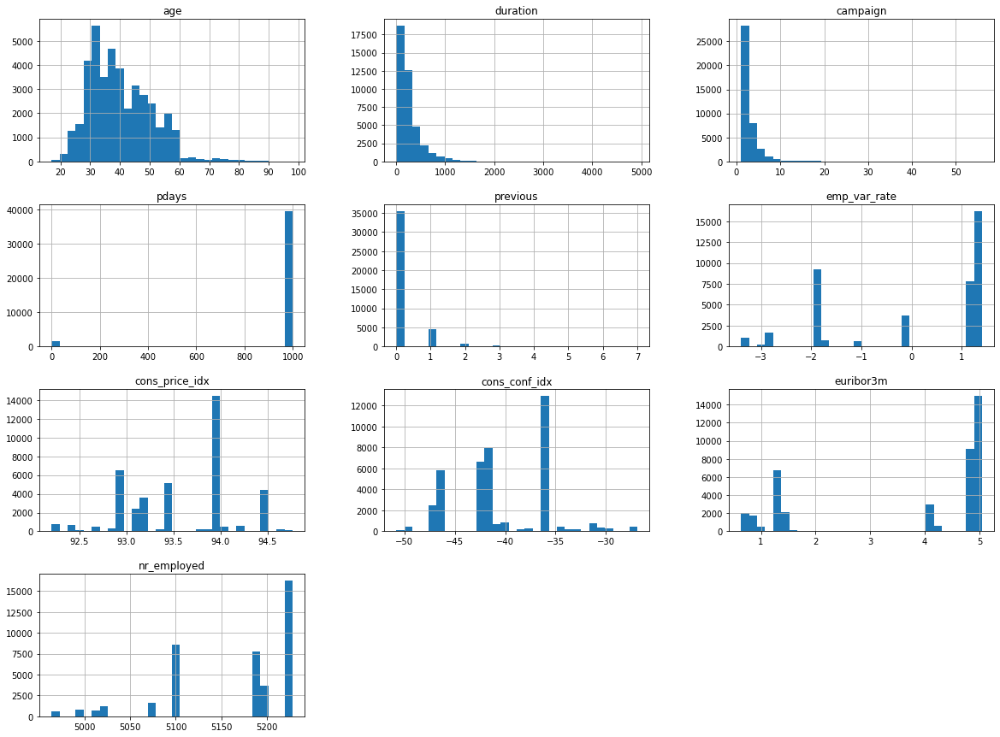

In [13]:
%matplotlib inline

data[numeric_col].hist(bins=30, figsize=(20,15))
plt.savefig("attribute_histogram_plots")
plt.show()

## Visualize a count values of Category Feature

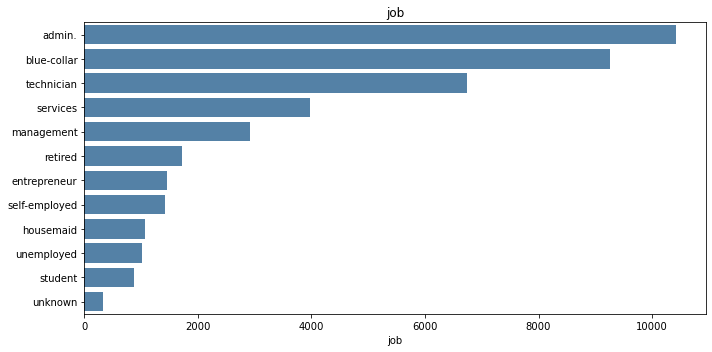

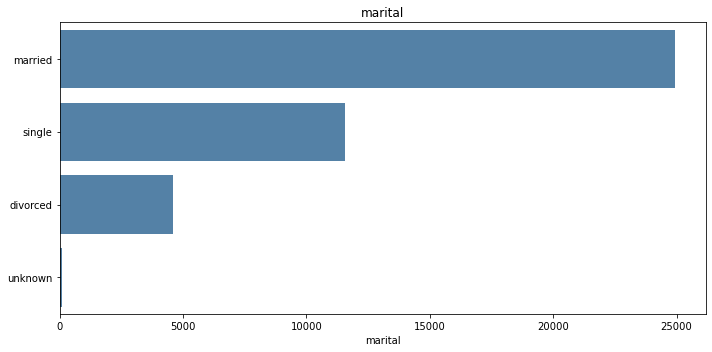

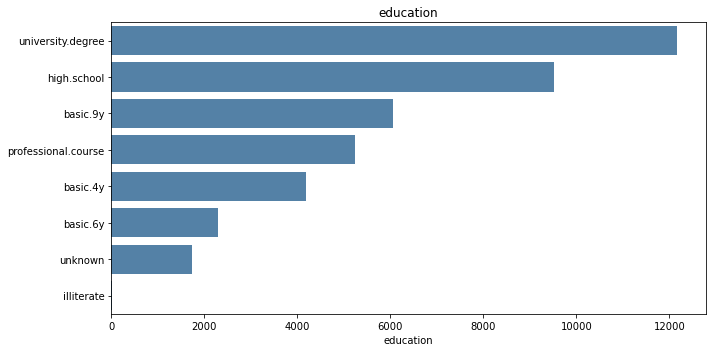

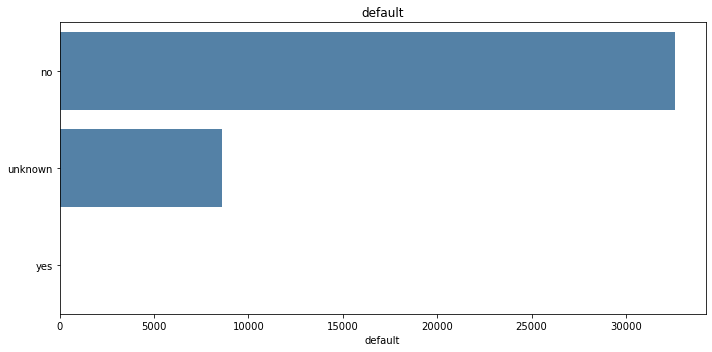

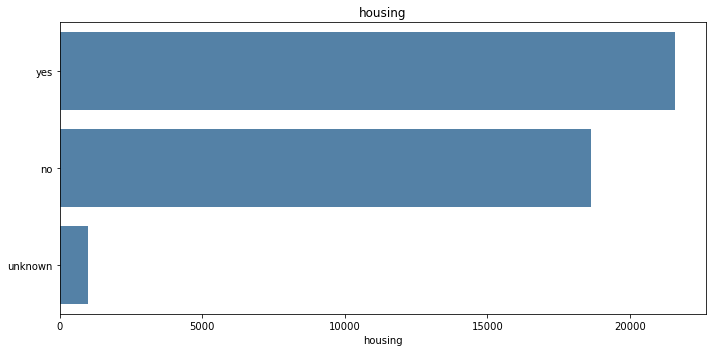

...

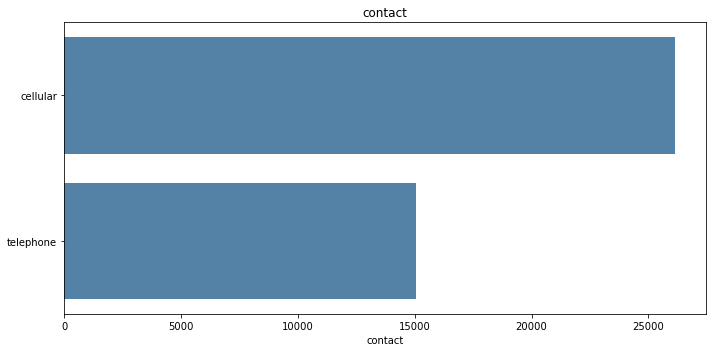

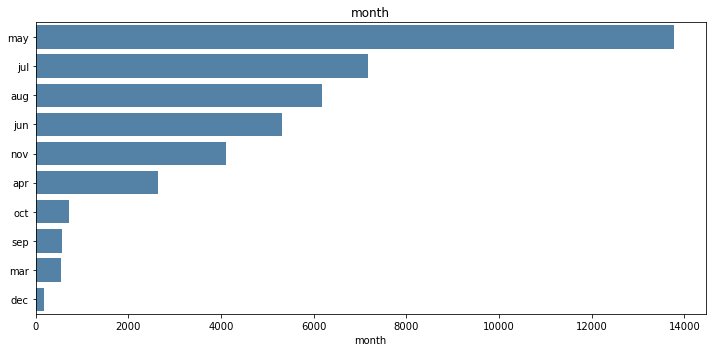

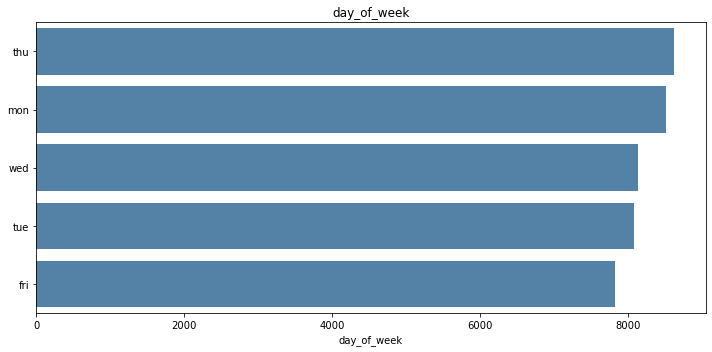

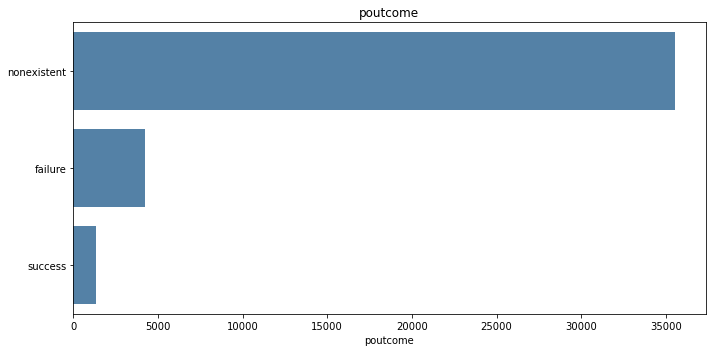

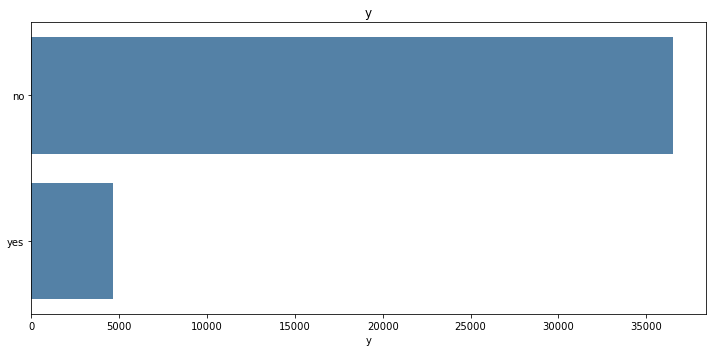

In [14]:
for col in category_col:
    plt.figure(figsize=(10,5))    
    sns.barplot(x=data[col].value_counts(), y=data[col].value_counts().index, data=data, color='steelblue')    
    plt.title(col)    
    plt.tight_layout()

## Our observations:

##### 1 - Job: The audiences of these campaigns target mostly administrators, blue-collars, and technicians.
##### 2 - Marital status: Most of them are married; married clients are twice as single people.
##### 3 - Education: Most clients have university education level while illiterate people are next to none.
##### 4 - default/credit: Most people have no default stay on their credit file.
##### 5 - housing: Most people have no housing loan.
##### 6 - loan: Most people have no personal loan.
##### 7 - contact: Common means of communication are cellular.
##### 8 - month: May is the busy month and December is the least busy month.
##### 9 - day of week: Thursday is the most busy day while Friday is the least busy day of the week
##### 10 - y: The number or people not subscribed is very higher than people subscribed. So its an indication of class imbalance. 

## Analyze client subscription decisions 

##### Subscription to the term deposit

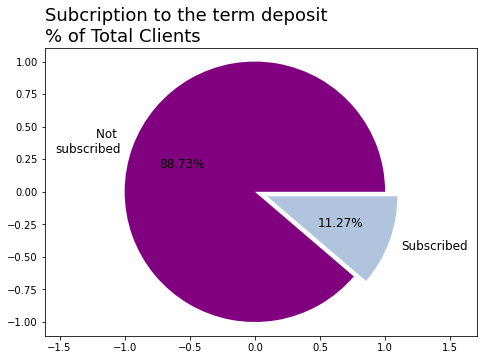

In [15]:
labels = ["Not \nsubscribed", "Subscribed"]
explode = (0, 0.1)  # only "explode" the second slice (i.e. 'Subscribed')

# depicting the visualization 
fig = plt.figure() 
ax = fig.add_axes([0,0,1,1]) 

ax.pie(data['y'].value_counts(), 
       labels = labels,
       explode = explode,
       autopct ='%1.2f%%',
       frame = True,
       textprops = dict(color ="black", size=12),
       colors = ['purple', 'lightsteelblue']) 

ax.axis('equal') 
plt.title('Subcription to the term deposit\n% of Total Clients',
     loc='left',
     color = 'black', 
     fontsize = '18')

plt.show()

Class imbalance occurs when the observations belonging to one class in the target are significantly higher than the other class or classes. A class distribution of 80:20 or greater is typically considered as an imbalance for a binary classification.
Since most machine learning algorithms assume that data is equally distributed, applying them on imbalanced data often results in bias towards majority classes and poor classification of minority classes. Hence we need to identify & deal with class imbalance.

##### Subscription to Age group

In [16]:
temp_data = data
temp_data.loc[temp_data["age"] < 30,  'age_group'] = 20
temp_data.loc[(temp_data["age"] >= 30) & (temp_data["age"] <= 39), 'age_group'] = 30
temp_data.loc[(temp_data["age"] >= 40) & (temp_data["age"] <= 49), 'age_group'] = 40
temp_data.loc[(temp_data["age"] >= 50) & (temp_data["age"] <= 59), 'age_group'] = 50
temp_data.loc[temp_data["age"] >= 60, 'age_group'] = 60

age_rate_sub = temp_data[temp_data['y'] == 'yes'][['age_group', 'y']].groupby('age_group').count()
age_rate_nonsub = temp_data[temp_data['y'] == 'no'][['age_group', 'y']].groupby('age_group').count()

age_rate_sub.y = age_rate_sub.y/age_rate_sub.y.sum() * 100
age_rate_nonsub.y = age_rate_nonsub.y/age_rate_nonsub.y.sum() * 100
    
print(age_rate_sub)
print(age_rate_nonsub)

                   y
age_group           
20.0       19.870690
30.0       36.961207
40.0       17.974138
50.0       15.021552
60.0       10.172414
                   y
age_group           
20.0       12.988399
30.0       41.652074
40.0       26.518551
50.0       16.868228
60.0        1.972748


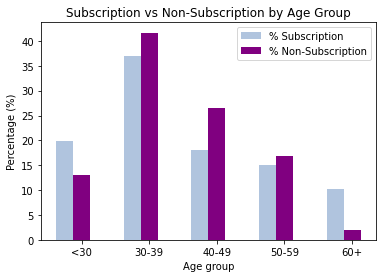

In [17]:
# set width of bar
barWidth = 0.25

# Set position of bar on X axis
br1 = np.arange(5)
br2 = [x + barWidth for x in br1]
br3 = [x + barWidth for x in br2]

# Make the plot
plt.bar(br1, age_rate_sub.y, color ='lightsteelblue', width = barWidth,
        label ='% Subscription')
plt.bar(br2, age_rate_nonsub.y, color ='purple', width = barWidth,
        label ='% Non-Subscription')
 
# Adding title
plt.title('Subscription vs Non-Subscription by Age Group')
plt.xlabel('Age group')
plt.ylabel('Percentage (%)')
plt.xticks([r + barWidth for r in range(5)],
        ['<30', '30-39', '40-49', '50-59', '60+'])
 
plt.legend()
plt.show()

Maximum subscription rate is within the age gap of 30-39 years

##### Subscription to contact rate by age

In [18]:
count_age_response = pd.crosstab(temp_data['y'], temp_data['age_group']).apply(lambda x: x/x.sum() * 100)
count_age_response = count_age_response.transpose()

age = pd.DataFrame(temp_data['age_group'].value_counts())
age = age.sort_index()
age['% Contacted'] = age['age_group']*100/age['age_group'].sum()
age['% Subscription'] = count_age_response['yes']
age.drop('age_group',axis = 1 ,inplace = True)
age

,% Contacted,% Subscription
20.0,13.763718,16.263891
30.0,41.123628,10.125162
40.0,25.555987,7.923238
50.0,16.660192,10.157389
60.0,2.896475,39.564124


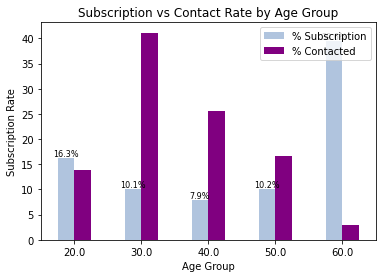

In [19]:
# Setup plot
plot_age = age[['% Subscription','% Contacted']].plot(kind = 'bar',
                                               color = ('lightsteelblue','purple'))
 
# Adding title
plt.title('Subscription vs Contact Rate by Age Group')
plt.ylabel('Subscription Rate')
plt.xlabel('Age Group')
plt.xticks(rotation = 'horizontal')

# label the bar
for rec, label in zip(plot_age.patches,
                      age['% Subscription'].round(1).astype(str)):
    plot_age.text(rec.get_x() + rec.get_width()/2, 
                      rec.get_height() + 0.25, 
                      label+'%',  
                      ha = 'center', 
                      color = 'black',
                      size = 8)
    
plt.legend()
plt.show()

##### Insights: Increase contacts or target the oldest and youngest more.

It is not surprising to see such a pattern because the main investment objective of older people is saving for retirement while the middle-aged group tend to be more aggressive with a main objective of generating high investment income. Term deposits, as the least risky investment tool, are more preferable to the eldest.
The youngest may not have enough money or professional knowledge to engage in sophisticated investments, such as stocks and mutual funds. Term deposits provide liquidity and generate interest incomes that are higher than the regular saving account, so term deposits are ideal investments for students.

But if we look at the violet bar graph, we can see that the bank focuses on marketing to middle-aged customers rather than younger and older customers.

##### Subscription to Job

In [20]:
count_job_response = pd.crosstab(temp_data['y'], temp_data['job']).apply(lambda x: x/x.sum() * 100)
count_job_response = count_job_response.transpose()

count_job_response

y,no,yes
job,,
admin.,87.027442,12.972558
blue-collar,93.105684,6.894316
entrepreneur,91.483516,8.516484
housemaid,90.000000,10.000000
management,88.782490,11.217510
retired,74.767442,25.232558
self-employed,89.514426,10.485574
services,91.861930,8.138070
student,68.571429,31.428571


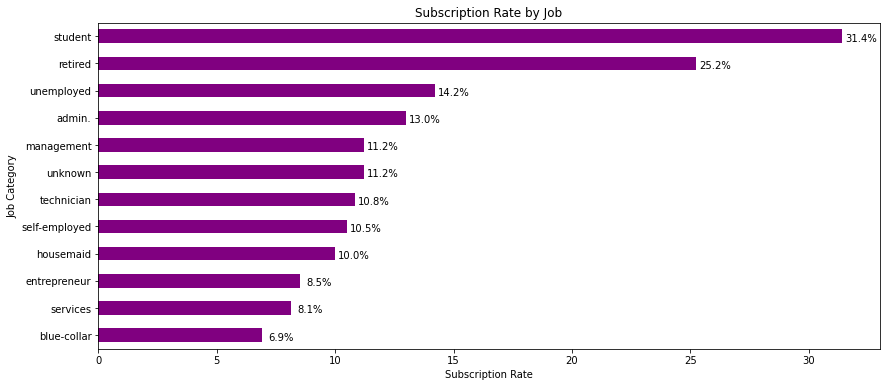

In [21]:
plot_job = count_job_response['yes'].sort_values(ascending = True).plot(kind ='barh',color = 'purple', figsize = (14,6))
                                                                               
plt.title('Subscription Rate by Job')
plt.xlabel('Subscription Rate')
plt.ylabel('Job Category')

# Label each bar
for rec, label in zip(plot_job.patches,
                      count_job_response['yes'].sort_values(ascending = True).round(1).astype(str)):
    plot_job.text(rec.get_width()+0.8, 
                  rec.get_y()+ rec.get_height()-0.5, 
                  label+'%', 
                  ha = 'center', 
                  va='bottom')

##### Insights: Target students and Retired clients

As noted from the horizontal bar chart, students and retired clients account for more than 50% of subscription, which is consistent with the previous finding of higher subscription rates among the younger and older.

## Analyze the campaign contact period for client.

In [22]:
month_sort = ['jan', 'feb', 'mar', 'apr', 'may', 'jun', 'jul', 'aug', 'sep', 'oct', 'nov', 'dec']

count_month_response = pd.crosstab(temp_data['y'], temp_data['month']).apply(lambda x: x/x.sum() * 100)
count_month_response = count_month_response.transpose()
count_month_response = count_month_response.reindex(month_sort)

month = pd.DataFrame(temp_data['month'].value_counts())
month['% Contacted'] = month['month']*100/month['month'].sum()
month['% Subscription'] = count_month_response['yes']
month.drop('month',axis = 1,inplace = True)
month = month.reindex(month_sort)

month

,% Contacted,% Subscription
jan,NaN,NaN
feb,NaN,NaN
mar,1.325629,50.549451
apr,6.390211,20.478723
may,33.429640,6.434745
jun,12.911528,10.511470
jul,17.417694,9.046557
aug,14.999514,10.602137
sep,1.383898,44.912281
oct,1.743226,43.871866


([<matplotlib.axis.XTick at 0x1546a83df40>,
 [Text(0, 0, 'jan'),
  Text(1, 0, 'feb'),
  Text(2, 0, 'mar'),
  Text(3, 0, 'apr'),
  Text(4, 0, 'may'),
  Text(5, 0, 'jun'),
  Text(6, 0, 'jul'),
  Text(7, 0, 'aug'),
  Text(8, 0, 'sep'),
  Text(9, 0, 'oct'),
  Text(10, 0, 'nov'),
  Text(11, 0, 'dec')])

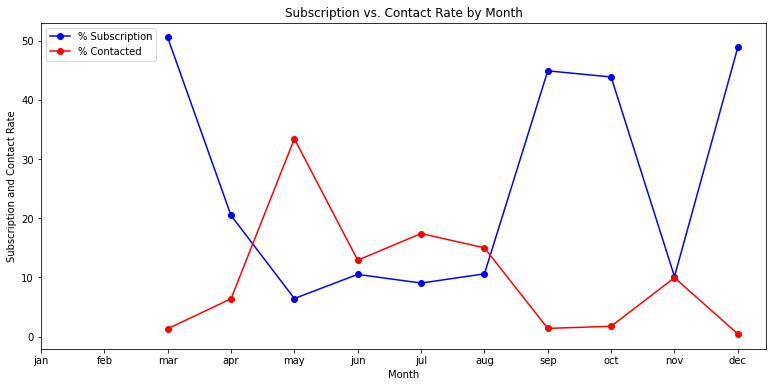

In [23]:
plot_month = month[['% Subscription','% Contacted']].plot(kind ='line',
                                                          color = ('blue','red'),
                                                          figsize = (13,6),
                                                          marker = 'o')

plt.title('Subscription vs. Contact Rate by Month')
plt.ylabel('Subscription and Contact Rate')
plt.xlabel('Month')

ticks = np.arange(0,12,1)
plt.xticks(ticks, month_sort)

Initiate the telemarketing campaign in mar and sep

This line chart displays the bank’s contact rate in each month as well as clients’ response rate in each month.

The bank contacted most clients between May and August. The highest contact rate is around 30%, which happened in May, while the contact rate is closer to 0 in March, September, October, and December.

However, the subscription rate showed a different trend. The highest subscription rate occurred in March, which is over 50%, and all subscription rates in September, October, and December are over 40%.

Clearly, these two lines move in different directions which strongly indicates the inappropriate timing of the bank’s marketing campaign. To improve the marketing campaign, the bank should consider initiating the telemarketing campaign in may and sep when the subscription rate tends to be higher.

In [24]:
fig=px.bar(data.poutcome.value_counts().reset_index().rename(columns={'index':'Poutcome','poutcome':'Count'}),x='Poutcome',y='Count',color='Poutcome',text='Count',color_discrete_sequence=['steelblue','teal','darkgreen'],template='simple_white')
fig.update_traces(marker=dict(line=dict(color='#000000', width=1.2)))
fig.update_layout(title_x=0.5,title_text='<b>Outcome of previous marketing Campaign',font_family="Times New Roman",title_font_family="Times New Roman")
fig.show()
fig=px.pie(data.poutcome.value_counts().reset_index().rename(columns={'index':'Poutcome','poutcome':'Count'}),names='Poutcome',values='Count',hole=0.5,template='simple_white',color_discrete_sequence=['steelblue','teal','darkgreen'])
fig.update_traces(marker=dict(line=dict(color='#000000', width=1.4)))
fig.update_layout(title_x=0.5,showlegend=True,legend_title_text='<b>Poutcome')
fig.update_traces(textposition='outside', textinfo='percent+label')
fig.update_layout(title_x=0.5,title_text='<b>Outcome of previous marketing Campaign',font_family="Times New Roman",title_font_family="Times New Roman")
fig.update_layout(title_x=0.5,legend=dict(orientation='v',yanchor='middle',y=1.02,xanchor='right',x=1))
fig.show()

##### Insight:

From the Outcomes of the previous marketing Campaign most of the results are Unknown ~ 86.3% and Failure ~ 10.3% .
Success rate is very less ~ 3.33%
From the Analysis, on doing Marketing Campaigns there is be more Failure than Success.

unknown refers to no marketing done.

## Boxplot visualisation 

In [25]:
fig=px.box(data,x='job',y='age',color='job',template='simple_white',title='<b>Distribution of age based on Job Type')
fig.update_layout(title_x=0.5,font_family="Times New Roman",legend_title_text="<b>Job type")

In [26]:
fig=px.box(data,x='marital',y='age',color='marital',template='simple_white',title='<b>Distribution of age based on Marital Status',color_discrete_sequence=['HotPink','LightSeaGreen','SlateBlue'])
fig.update_layout(title_x=0.5,font_family="Times New Roman",legend_title_text="<b>Marital Status")
fig.show()

Insight:

The median age of the married people is 41 and for the divorced people is 44.
The median age of the people who are single is 31

In [27]:
fig=px.box(data,x='education',y='age',color='education',template='simple_white',title='<b>Distribution of age based on Education Level')
fig.update_layout(title_x=0.5,font_family="Times New Roman",legend_title_text="<b>Education Level")
fig.show()

Insight:

The median age of the primary education level of the clients is 47 and the secondary education level of the clients is 38.
The median age of the clients whose Education level is unknown is 45
The median age of the clients whose Education level Tertiary is 36

In [28]:
fig=px.box(data,x='housing',y='age',color='housing',template='simple_white',title='<b>Distribution of age based on Housin Loan Status')
fig.update_layout(title_x=0.5,font_family="Times New Roman",legend_title_text="<b>Housing Loan")
fig.show()

##### Insight:

The median age of the clients who subscribed for the housing loan is 37.
The median age of the clients who are not subscribed for the housing loan is 41.

## Heatmap for show the correlation for each features 

Text(0.5, 1.0, 'Correlation Heatmap')

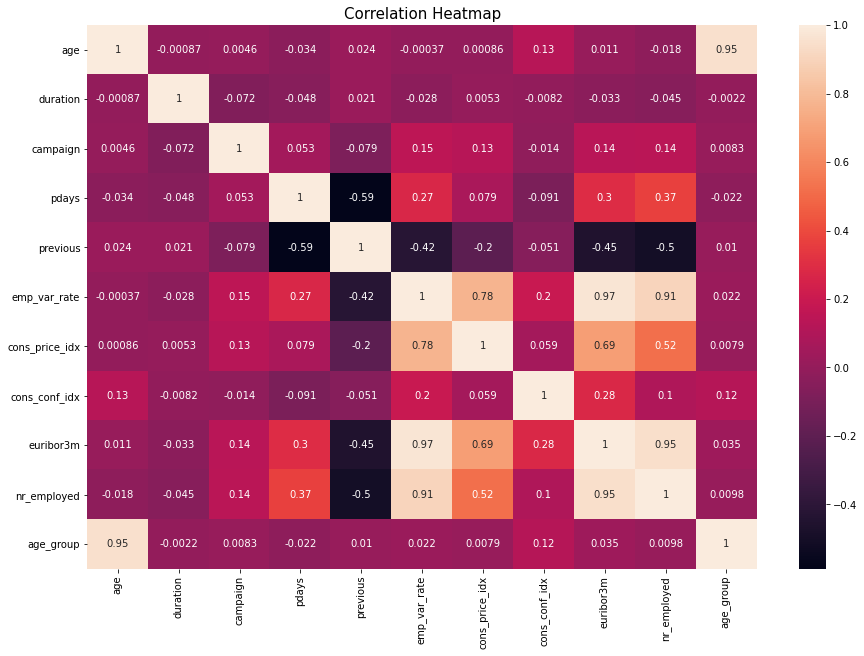

In [29]:
fig = plt.figure(figsize=(15, 10))
heatmap = sns.heatmap(data.corr(),annot = True)
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':15})

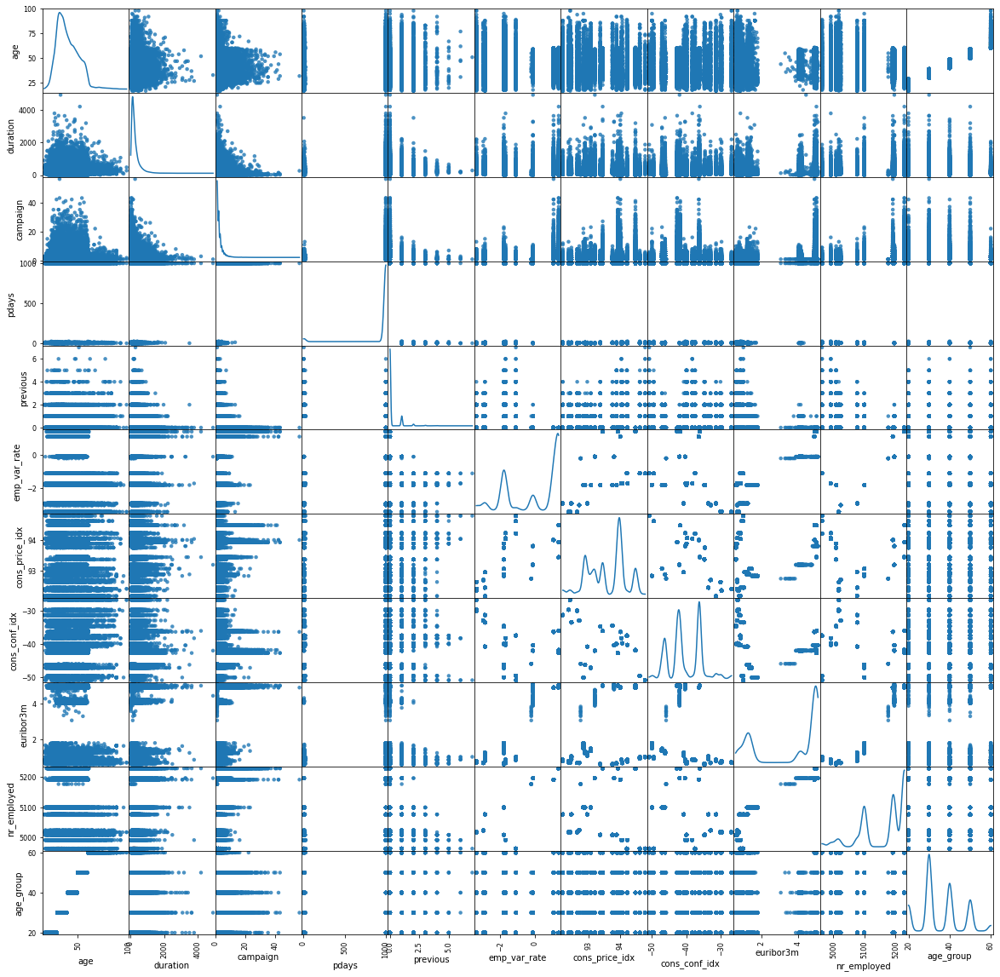

In [30]:
grr = pd.plotting.scatter_matrix(data, figsize=(20, 20), marker='o', hist_kwds={'bins': 20}, s=20, alpha=.8, diagonal='kde')
plt.show()

# DATA PREPROCESSING

## 1) CHECKING AND TREATING MISSING DATA / NULL VALUES

One of the main steps in data preprocessing is handling missing data. Missing data means absence of observations in columns that can be caused while procuring the data, lack of information, incomplete results etc. Feeding missing data to your machine learning model could lead to wrong prediction or classification. Hence it is necessary to identify missing values and treat them.

In [31]:
data = data[['age', 'job', 'marital', 'education', 'default', 'housing', 'loan',
       'contact', 'month', 'day_of_week', 'duration', 'campaign', 'pdays',
       'previous', 'poutcome', 'emp_var_rate', 'cons_price_idx',
       'cons_conf_idx', 'euribor3m', 'nr_employed', 'y']].replace("unknown" , np.nan)

In [32]:
data.isnull().sum()

age                  0
job                330
marital             80
education         1731
default           8597
housing            990
loan               990
contact              0
month                0
day_of_week          0
duration             0
campaign             0
pdays                0
previous             0
poutcome             0
emp_var_rate         0
cons_price_idx       0
cons_conf_idx        0
euribor3m            0
nr_employed          0
y                    0
dtype: int64

In [33]:
imputer = SimpleImputer(missing_values=np.nan, strategy='most_frequent')
imputer = imputer.fit(data[['job', 'marital', 'education', 'default', 'housing', 'loan']])
data[['job', 'marital', 'education', 'default', 'housing', 'loan']] = imputer.transform(data[['job', 'marital', 'education', 'default', 'housing', 'loan']])

In [34]:
data.shape

(41188, 21)

In [35]:
data.isnull().sum()

age               0
job               0
marital           0
education         0
default           0
housing           0
loan              0
contact           0
month             0
day_of_week       0
duration          0
campaign          0
pdays             0
previous          0
poutcome          0
emp_var_rate      0
cons_price_idx    0
cons_conf_idx     0
euribor3m         0
nr_employed       0
y                 0
dtype: int64

In [36]:
data.columns

Index(['age', 'job', 'marital', 'education', 'default', 'housing', 'loan',
       'contact', 'month', 'day_of_week', 'duration', 'campaign', 'pdays',
       'previous', 'poutcome', 'emp_var_rate', 'cons_price_idx',
       'cons_conf_idx', 'euribor3m', 'nr_employed', 'y'],
      dtype='object')

## 2) CHECKING AND TREATING OUTLIERS

Outliers are observations that lie far away from majority of observations in the dataset and can be represented mathematically in different ways.
One method of defining outliers are: outliers are data points lying beyond (third quartile + 1.5xIQR) and below (first quartile - 1.5xIQR).

In [37]:
#defining a function to see the outliers
def outliers_detection(data):
    cols = data.columns
    outliers = pd.DataFrame(columns=['Feature','Number of Outliers'])
    
    for column in cols:
        if column in data.select_dtypes(include=np.number).columns:
        # first quartile (Q1)
            q1 = data[column].quantile(0.25) 
            
            # third quartile (Q3)
            q3 = data[column].quantile(0.75)
            
            # IQR
            iqr = q3 - q1
            
            lower_bound = q1 - (1.5*iqr)
            upper_bound = q3 + (1.5*iqr)
            outliers = outliers.append({'Feature':column,'Number of Outliers':data.loc[(data[column] < lower_bound) | (data[column] > upper_bound)].shape[0]},ignore_index=True)
    return outliers

outliers_detection(data)   

,Feature,Number of Outliers
0,age,469
1,duration,2963
2,campaign,2406
3,pdays,1515
4,previous,5625
5,emp_var_rate,0
6,cons_price_idx,0
7,cons_conf_idx,447
8,euribor3m,0
9,nr_employed,0


reference : https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.select_dtypes.html

As per the IQR methodology, there are outliers in majority of the columns. Now lets see how to deal with the outliers

3 common methods to deal with oultiers are :

Winsorizing: Winsorization is the process of replacing the extreme values of statistical data in order to limit the effect of the outliers on the calculations or the results obtained by using that data. 

Clipping:Given an interval, values outside the interval are clipped to the interval edges.

Removing: Just taking them out.

In [38]:
def treat_outliers(data):
    cols = list(data)
    for col in cols:
        if col in data.select_dtypes(include=np.number).columns:
            data[col] = data[col].clip(lower=data[col].quantile(0.10), upper=data[col].quantile(0.90))
    
    return data    

data = treat_outliers(data)

In [39]:
#checking the shape of data after outliers treatment
data.shape

(41188, 21)

## 3) HANDLING CATEGORICAL FEATURES

The categorical features we have are job, marital, education, default, housing, loan, contact, month, day_of_week and poutcome.
Looking into the type of fields each categorical columns have:

In [40]:
print("job:",data['job'].unique())
print('marital',data['marital'].unique())
print('education',data['education'].unique())
print('default',data['default'].unique())
print('housing',data['housing'].unique())
print('loan',data['loan'].unique())
print('contact',data['contact'].unique())
print('month',data['month'].unique())
print('day_of_week',data['day_of_week'].unique())
print('poutcome',data['poutcome'].unique())

job: ['housemaid' 'services' 'admin.' 'blue-collar' 'technician' 'retired'
 'management' 'unemployed' 'self-employed' 'entrepreneur' 'student']
marital ['married' 'single' 'divorced']
education ['basic.4y' 'high.school' 'basic.6y' 'basic.9y' 'professional.course'
 'university.degree' 'illiterate']
default ['no' 'yes']
housing ['no' 'yes']
loan ['no' 'yes']
contact ['telephone' 'cellular']
month ['may' 'jun' 'jul' 'aug' 'oct' 'nov' 'dec' 'mar' 'apr' 'sep']
day_of_week ['mon' 'tue' 'wed' 'thu' 'fri']
poutcome ['nonexistent' 'failure' 'success']


##### Encoding should be done to convert the categorical datas to numerical.The two common encoding are:

  1)Label Encoding - This approach is very simple and it involves converting each value in a column into a number. 
  
  2)One Hot Encoding - One-hot encoding converts the categorical data into numeric data by splitting the column into multiple columns. The numbers are replaced by 1s and 0s, depending on which column has what value. 
  
One-hot encoding is generally considered better than label encoding in most cases because it avoids introducing any unintended relationship or order between the categories of a categorical variable, and allows the machine learning model to treat each category as an independent variable.

Overall, one-hot encoding is preferred over label encoding in most cases, as it is more robust, captures non-linear relationships, preserves all the information, and allows for easy interpretation of the model.

One hot encoding

In [41]:
categorical_data = data[['default','job','marital','housing','loan','contact','month','day_of_week','poutcome',"education"]]
encoder = OneHotEncoder()
one_hot_df = encoder.fit_transform(categorical_data)

# Get feature names after one-hot encoding
feature_names = encoder.get_feature_names_out(categorical_data.columns)

# Convert encoded data to DataFrame with feature names
one_hot_df = pd.DataFrame(one_hot_df.toarray(), columns=feature_names)

#concatenate with encoded dataframe

data = pd.concat([data, one_hot_df], axis=1)
data = data.drop(categorical_data.columns, axis=1)

The line one_hot_df = pd.DataFrame(one_hot_df.toarray(), columns=feature_names) is used to convert the output of the OneHotEncoder from a sparse matrix to a dense dataframe with column names. The toarray() method converts the sparse matrix to a numpy array, and the resulting array is used to create a new Pandas dataframe

In [42]:
data.shape

(41188, 58)

In [43]:
data.head()

,age,duration,campaign,pdays,previous,emp_var_rate,cons_price_idx,cons_conf_idx,euribor3m,nr_employed,...,poutcome_failure,poutcome_nonexistent,poutcome_success,education_basic.4y,education_basic.6y,education_basic.9y,education_high.school,education_illiterate,education_professional.course,education_university.degree
0,55,261,1,999,0,1.1,93.994,-36.4,4.857,5191.0,...,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1,55,149,1,999,0,1.1,93.994,-36.4,4.857,5191.0,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
2,37,226,1,999,0,1.1,93.994,-36.4,4.857,5191.0,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
3,40,151,1,999,0,1.1,93.994,-36.4,4.857,5191.0,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
4,55,307,1,999,0,1.1,93.994,-36.4,4.857,5191.0,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


In [44]:
data.columns

Index(['age', 'duration', 'campaign', 'pdays', 'previous', 'emp_var_rate',
       'cons_price_idx', 'cons_conf_idx', 'euribor3m', 'nr_employed', 'y',
       'default_no', 'default_yes', 'job_admin.', 'job_blue-collar',
       'job_entrepreneur', 'job_housemaid', 'job_management', 'job_retired',
       'job_self-employed', 'job_services', 'job_student', 'job_technician',
       'job_unemployed', 'marital_divorced', 'marital_married',
       'marital_single', 'housing_no', 'housing_yes', 'loan_no', 'loan_yes',
       'contact_cellular', 'contact_telephone', 'month_apr', 'month_aug',
       'month_dec', 'month_jul', 'month_jun', 'month_mar', 'month_may',
       'month_nov', 'month_oct', 'month_sep', 'day_of_week_fri',
       'day_of_week_mon', 'day_of_week_thu', 'day_of_week_tue',
       'day_of_week_wed', 'poutcome_failure', 'poutcome_nonexistent',
       'poutcome_success', 'education_basic.4y', 'education_basic.6y',
       'education_basic.9y', 'education_high.school', 'education_illit

In [45]:
data.dtypes

age                                int64
duration                           int64
campaign                           int64
pdays                              int64
previous                           int64
emp_var_rate                     float64
cons_price_idx                   float64
cons_conf_idx                    float64
euribor3m                        float64
nr_employed                      float64
y                                 object
default_no                       float64
default_yes                      float64
job_admin.                       float64
job_blue-collar                  float64
job_entrepreneur                 float64
job_housemaid                    float64
job_management                   float64
job_retired                      float64
job_self-employed                float64
job_services                     float64
job_student                      float64
job_technician                   float64
job_unemployed                   float64
marital_divorced

## 4) PREPROCESSING FOR MODEL-FITTING

In [46]:
data["y"] = data["y"].replace(['yes','no'],[1,0]) 

In [47]:
X=(data.drop(['y'],axis=1))
y=data['y']


In [48]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test = train_test_split(X, y, test_size=0.2,random_state=2)

In [49]:
print ('Train set:', X_train.shape,  y_train.shape)
print ('Test set:', X_test.shape,  y_test.shape)

Train set: (32950, 57) (32950,)
Test set: (8238, 57) (8238,)


In [50]:
X_train["y_train"] = y_train

In [51]:
X_train

,age,duration,campaign,pdays,previous,emp_var_rate,cons_price_idx,cons_conf_idx,euribor3m,nr_employed,...,poutcome_nonexistent,poutcome_success,education_basic.4y,education_basic.6y,education_basic.9y,education_high.school,education_illiterate,education_professional.course,education_university.degree,y_train
9917,36,116,5,999,0,1.4,94.465,-41.8,4.959,5228.1,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0
23224,47,225,2,999,0,1.4,93.444,-36.1,4.964,5228.1,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0
24883,32,63,1,999,0,-0.1,93.200,-42.0,4.153,5195.8,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0
27029,47,322,1,999,0,-0.1,93.200,-42.0,4.021,5195.8,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0
9709,47,224,3,999,0,1.4,94.465,-41.8,4.961,5228.1,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31019,41,278,1,999,0,-1.8,92.893,-46.2,1.344,5099.1,...,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0
30280,28,209,1,999,0,-1.8,93.075,-46.2,1.365,5099.1,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0
6637,32,71,2,999,0,1.1,93.994,-36.4,4.857,5191.0,...,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0
35343,32,59,5,999,0,-1.8,92.893,-46.2,1.250,5099.1,...,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0


## 5) FEATURE SCALING

A data preprocessing method called scaling, also referred to as feature scaling, is used in machine learning to convert features or variables in a dataset to a standard range. It involves changing the feature values' range so that they fall within a specific scale or range. Scaling is used to enhance the model's performance and make sure that each feature contributes equally to the machine learning algorithm.
There are several methods for scaling features, including MinMaxScaler, StandardScaler, MaxAbsScaler, and RobustScaler. 

MinMaxScaler: Use MinMaxScaler when you want to scale the data to a fixed range of [0,1]. This scaler is useful when there are outliers in the data, and the distribution of the data is not Gaussian.

StandardScaler: Use StandardScaler when the distribution of the data is Gaussian. This scaler scales the data so that it has a mean of 0 and a standard deviation of 1.

MaxAbsScaler: Use MaxAbsScaler when you want to scale the data to a range of [-1, 1]. This scaler is useful when the data contains both positive and negative values.

RobustScaler: Use RobustScaler when the data contains outliers. This scaler scales the data using statistics that are robust to outliers.


In [52]:
scaler = MinMaxScaler()
X_train_std = pd.DataFrame(scaler.fit_transform(X_train), columns = X_train.columns)
X_test_std = pd.DataFrame(scaler.fit_transform(X_test), columns = X_test.columns)

## 6) CHECKING CLASS IMBALANCE

In [53]:
data["y"].value_counts()

0    36548
1     4640
Name: y, dtype: int64

Its a clear case of class imbalance as 36548 people are non subscribers which accounts for about 88.7% of total. Only 11.3 % people subscribed.

In [54]:
#checking on train data 
X_train_std["y_train"].value_counts()

0.0    29230
1.0     3720
Name: y_train, dtype: int64

This imbalance is to be treated so that there is no bias in modeling. Imbalance is generally treated in three ways.

Random Undersampling

Random Oversampling

Synthetic Minority Oversampling Technique (SMOTE)

A)Random Undersampling

Random Undersampling is a technique in which the majority category, in this case 0 category is randomly sampled to match the size of the minority '1' category. Remaining data of majority category is discarded.



In [55]:
rus = RandomUnderSampler(random_state=0)
X_Usampled, y_Usampled = rus.fit_resample(X_train_std, y_train)
pd.Series(y_Usampled).value_counts()

0    3720
1    3720
Name: y, dtype: int64

B)Random Oversampling

Random Oversampling is a technique in which the minority category 'no' is randomly sampled with replacement to match the size of the majority 'no' category. Minority category entries will be repeated many times.

In [56]:
ros = RandomOverSampler(random_state=0)
X_Osampled, y_Osampled = ros.fit_resample(X_train_std, y_train)
pd.Series(y_Osampled).value_counts()

0    29230
1    29230
Name: y, dtype: int64

C) SMOTE - Synthetic Minority Oversampling Technique

This is an oversampling technique in which instead of randomly repeating minority 'yes' category, new entires are sythetically created maintaining the convexity of minority entry space. Minority category will again match the majority category samples.



In [57]:
sm = SMOTE(random_state=0)
X_SMOTE, y_SMOTE = sm.fit_resample(X_train_std, y_train)
pd.Series(y_SMOTE).value_counts()

0    29230
1    29230
Name: y, dtype: int64

In [58]:
X_train_std

,age,duration,campaign,pdays,previous,emp_var_rate,cons_price_idx,cons_conf_idx,euribor3m,nr_employed,...,poutcome_nonexistent,poutcome_success,education_basic.4y,education_basic.6y,education_basic.9y,education_high.school,education_illiterate,education_professional.course,education_university.degree,y_train
0,0.296296,0.115854,1.00,0.0,0.0,1.00000,1.000000,0.435644,0.998724,1.000000,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,0.703704,0.337398,0.25,0.0,0.0,1.00000,0.350509,1.000000,1.000000,1.000000,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,0.148148,0.008130,0.00,0.0,0.0,0.53125,0.195293,0.415842,0.793007,0.787360,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,0.703704,0.534553,0.00,0.0,0.0,0.53125,0.195293,0.415842,0.759316,0.787360,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,0.703704,0.335366,0.50,0.0,0.0,1.00000,1.000000,0.435644,0.999234,1.000000,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32945,0.481481,0.445122,0.00,0.0,0.0,0.00000,0.000000,0.000000,0.076059,0.150757,...,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
32946,0.000000,0.304878,0.00,0.0,0.0,0.00000,0.115776,0.000000,0.081419,0.150757,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
32947,0.148148,0.024390,0.25,0.0,0.0,0.90625,0.700382,0.970297,0.972690,0.755760,...,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
32948,0.148148,0.000000,1.00,0.0,0.0,0.00000,0.000000,0.000000,0.052067,0.150757,...,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0


# MODELLING

In [59]:
X_train_std = X_train_std.drop('y_train', axis=1)
X_Usampled = X_Usampled.drop('y_train', axis=1)
X_Osampled = X_Osampled.drop('y_train', axis=1)
X_SMOTE = X_SMOTE.drop('y_train', axis = 1)

## 1- Logistic Model

1 - Imbalanced Data

In [60]:
lg_model1 = LogisticRegression()
lg_model1.fit(X_train_std, y_train)

C:\Users\devik\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



LogisticRegression()

In [61]:
y_pred_lg = lg_model1.predict(X_test_std)
print(accuracy_score(y_test, y_pred_lg))

0.9094440398154892


In [62]:
print("Test score:", lg_model1.score(X_test, y_test))
print("Train score:", lg_model1.score(X_train_std, y_train))

Test score: 0.8883224083515416
Train score: 0.9066464339908953


2 - Undersampled Data

In [63]:
lg_model2 = LogisticRegression(max_iter=1000)
lg_model2.fit(X_Usampled, y_Usampled)

LogisticRegression(max_iter=1000)

In [64]:
y_pred_lg2 = lg_model2.predict(X_test_std)
print(accuracy_score(y_test, y_pred_lg2))

0.8463219227967953


In [65]:
print("Test score:", lg_model2.score(X_test, y_test))
print("Train score:", lg_model2.score(X_Usampled, y_Usampled))

Test score: 0.8883224083515416
Train score: 0.8689516129032258


3 - Oversampled Data

In [66]:
lg_model3 = LogisticRegression(max_iter=1000)
lg_model3.fit(X_Osampled, y_Osampled)

LogisticRegression(max_iter=1000)

In [67]:
y_pred_lg3 = lg_model3.predict(X_test_std)
print(accuracy_score(y_test, y_pred_lg3))

0.8434085943190095


In [68]:
print("Test score:", lg_model3.score(X_test, y_test))
print("Train score:", lg_model3.score(X_Osampled, y_Osampled))

Test score: 0.8883224083515416
Train score: 0.8740677386247007


4 - SMOTE DATA

In [69]:
lg_model4 = LogisticRegression(max_iter=1000)
lg_model4.fit(X_SMOTE, y_SMOTE)

LogisticRegression(max_iter=1000)

Balanced Data done using SMOTE method gives the best Model accuracy, Test and Train score

In [70]:
y_pred_lg4 = lg_model4.predict(X_test_std)
print(accuracy_score(y_test, y_pred_lg4))

0.8503277494537509


In [71]:
print("Test score:", lg_model4.score(X_test, y_test))
print("Train score:", lg_model4.score(X_SMOTE, y_SMOTE))

Test score: 0.8883224083515416
Train score: 0.8840916866233322


##### Hyperparamter Tuning 

- GridSearchCV - This method involves specifying a grid of hyperparameter values to try, and training the model with all possible combinations of these values. 

It is a systematic approach to hyperparameter tuning that guarantees to find the optimal combination of hyperparameters within the specified grid. However, it can be computationally expensive, especially if the hyperparameter space is large.

- RandomizedSearchCV - This method involves randomly sampling hyperparameters from a specified distribution, and training the model with each set of sampled hyperparameters.

RandomizedSearchCV is faster than GridSearchCV because it does not require training the model with all possible combinations of hyperparameters. Instead, it samples a specified number of hyperparameter combinations from the distribution. This makes it a good choice when the hyperparameter space is large and exhaustive search is not feasible. 

In [72]:
# Assigning values to the parameters
hyperparameters = {
    'penalty': ['l1', 'l2', 'elasticnet', 'none'],
    'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000],
    'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],
    'max_iter': [100, 500, 1000]
}

#estimator
lg = LogisticRegression()
random_search = RandomizedSearchCV(lg, hyperparameters, cv=5, n_iter=50, random_state=1)
random_search.fit(X_SMOTE, y_SMOTE)

C:\Users\devik\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1173: FutureWarning:

`penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.

C:\Users\devik\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1181: UserWarning:

Setting penalty=None will ignore the C and l1_ratio parameters

C:\Users\devik\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

C:\Users\devik\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1173: FutureWarning:

`penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.

C:\Users\devik\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1181: UserWarning:

Setting penalty=None will ignore the C and l1_ratio parameters

C:\Users\devik\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: 

C:\Users\devik\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

C:\Users\devik\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1173: FutureWarning:

`penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.

C:\Users\devik\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1181: UserWarning:

Setting penalty=None will ignore the C and l1_ratio parameters

C:\Users\devik\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
S

C:\Users\devik\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1173: FutureWarning:

`penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.

C:\Users\devik\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1181: UserWarning:

Setting penalty=None will ignore the C and l1_ratio parameters

C:\Users\devik\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

C:\Users\devik\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1173: FutureWarning:

`penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.

C:\Users\devik\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1181: UserWarning:

Setting penalty=None will ignore the C and l1_ratio parameters

C:\Users\devik\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: 

C:\Users\devik\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



RandomizedSearchCV(cv=5, estimator=LogisticRegression(), n_iter=50,
                   param_distributions={'C': [0.001, 0.01, 0.1, 1, 10, 100,
                                              1000],
                                        'max_iter': [100, 500, 1000],
                                        'penalty': ['l1', 'l2', 'elasticnet',
                                                    'none'],
                                        'solver': ['newton-cg', 'lbfgs',
                                                   'liblinear', 'sag',
                                                   'saga']},
                   random_state=1)

In [73]:
random_search.best_params_

{'solver': 'lbfgs', 'penalty': 'none', 'max_iter': 100, 'C': 10}

In [74]:
lg_model = LogisticRegression(solver= 'lbfgs', penalty= 'none', max_iter = 100, C= 10)
lg_model.fit(X_SMOTE, y_SMOTE)
y_pred_lg = lg_model.predict(X_test_std)


C:\Users\devik\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1173: FutureWarning:

`penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.

C:\Users\devik\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1181: UserWarning:

Setting penalty=None will ignore the C and l1_ratio parameters

C:\Users\devik\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



In [75]:
y_pred_lg

array([0, 0, 1, ..., 0, 0, 0], dtype=int64)

## 2 - Decision Tree

Hyperparameter Tuning for Decision Tree Classifier using Randomised Search CV

In [76]:
# Assigning values to the parameters
depth=[5, 10, 50, 100, 500]
min_samples_split=[5,10,20,30,40,50]
criterion=["gini", "entropy"]
params_grid=dict(max_depth=depth,min_samples_split=min_samples_split,criterion=criterion)

# Estimator
DT = DecisionTreeClassifier()

# Building RandomisedSearchCv
DT_RandomCV=RandomizedSearchCV(DT,params_grid,cv=5,n_iter=60,scoring='accuracy',n_jobs=-1)
DT_RandomCV.fit(X_SMOTE,y_SMOTE)

RandomizedSearchCV(cv=5, estimator=DecisionTreeClassifier(), n_iter=60,
                   n_jobs=-1,
                   param_distributions={'criterion': ['gini', 'entropy'],
                                        'max_depth': [5, 10, 50, 100, 500],
                                        'min_samples_split': [5, 10, 20, 30, 40,
                                                              50]},
                   scoring='accuracy')

Finding the best parameters using Hyperparameter Tuning

In [77]:
print(DT_RandomCV.best_params_)

{'min_samples_split': 5, 'max_depth': 50, 'criterion': 'entropy'}


In [80]:
DT_model = DecisionTreeClassifier(min_samples_split=5, max_depth=50, criterion='entropy')
DT_model.fit(X_SMOTE,y_SMOTE)


DecisionTreeClassifier(criterion='entropy', max_depth=50, min_samples_split=5)

In [81]:
y_pred = DT_model.predict(X_test_std)

## 3 - KNN MODEL

hyperparameter tuning for knn is done using elbow method

In [82]:
# creating odd list of K for KNN
neighbors = list(range(1,31,2))

# empty list that will hold cv scores
cv_scores = []


for k in neighbors:
    knn = KNeighborsClassifier(n_neighbors=k)
    scores = cross_val_score(knn, X_SMOTE, y_SMOTE, cv=5, scoring='accuracy')
    cv_scores.append(scores.mean())

KNN does not involve learning a model with parameters, there is no penalty term that can be added to the loss function to regularize it. Therefore, regularization techniques such as L1 regularization or L2 regularization cannot be applied to KNN.

#### Building KNN model with best k value:11

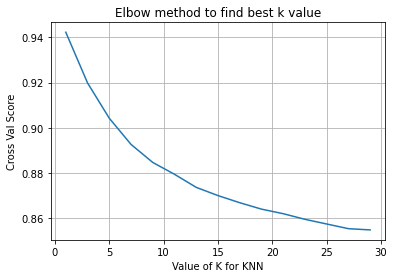

In [83]:
plt.plot(neighbors, cv_scores)
plt.grid(True)
plt.xlabel('Value of K for KNN')
plt.ylabel('Cross Val Score')
plt.title("Elbow method to find best k value")
plt.show()

In [84]:
KNN = KNeighborsClassifier(n_neighbors=11,n_jobs=-1)
KNN.fit(X_SMOTE, y_SMOTE)#fitting the model
y_test_pred=KNN.predict(X_test_std)


# ENSEMBLE METHODS

## 4 - BOOSTING

Boosting involves sequentially training a series of models, with each model being trained to focus on the samples that were misclassified by the previous models. Boosting is effective at reducing bias and improving accuracy, and it can improve the performance of weak models that would otherwise be ineffective on their own.

### A) XG BOOST

XGBoost is a highly optimized implementation of gradient boosting that uses a combination of decision trees and gradient boosting to achieve high performance on a wide range of machine learning problems. XGBoost is known for its scalability, speed, and accuracy, and it has been used to win several machine learning competitions.

In [88]:
# Assigning values to the parameters
params_grid = {
    'n_estimators': [50, 100, 200, 500],
    'learning_rate': [0.01, 0.1, 0.5, 1.0],
    'max_depth': [3, 5, 7, 9],
    'subsample': [0.5, 0.7, 0.9],
    'colsample_bytree': [0.5, 0.7, 0.9],
    'gamma': [0, 0.1, 0.5, 1.0],
    'reg_alpha': [0, 0.1, 1.0, 10.0],
    'reg_lambda': [0, 0.1, 1.0, 10.0]}

# Estimator
xgb=XGBClassifier(random_state=5)

# Building RandomizedsearchCV
xgb_RandomCV=RandomizedSearchCV(xgb,params_grid,cv=3,scoring='accuracy',n_jobs=-1)
xgb_RandomCV.fit(X_SMOTE,y_SMOTE)

RandomizedSearchCV(cv=3,
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           callbacks=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None,
                                           early_stopping_rounds=None,
                                           enable_categorical=False,
                                           eval_metric=None, feature_types=None,
                                           gamma=None, gpu_id=None,
                                           grow_policy=None,
                                           importance_type=None,
                                           interaction_constraints=None,
                                           learning_rate...
                                           n_estimators=100, n_jobs=None,
                                           num_parallel_tree=None,
                                           predictor=None, random_state=5, ...),
                   n_jobs=-1,
                   param_distributions={'colsample_bytree': [0.5, 0.7, 0.9],
                                        'gamma': [0, 0.1, 0.5, 1.0],
                                        'learning_rate': [0.01, 0.1, 0.5, 1.0],
                                        'max_depth': [3, 5, 7, 9],
                                        'n_estimators': [50, 100, 200, 500],
                                        'reg_alpha': [0, 0.1, 1.0, 10.0],
                                        'reg_lambda': [0, 0.1, 1.0, 10.0],
                                        'subsample': [0.5, 0.7, 0.9]},
                   scoring='accuracy')

In [89]:
xgb_RandomCV.best_params_

{'subsample': 0.7,
 'reg_lambda': 10.0,
 'reg_alpha': 10.0,
 'n_estimators': 50,
 'max_depth': 9,
 'learning_rate': 1.0,
 'gamma': 0.1,
 'colsample_bytree': 0.7}

In [90]:
XGB=XGBClassifier(subsample= 0.7,reg_lambda= 10.0,reg_alpha= 10.0,n_estimators= 50,max_depth= 9,learning_rate= 1.0,gamma= 0.1,colsample_bytree= 0.7)
XGB.fit(X_SMOTE,y_SMOTE)
y_test_pred_XGB=XGB.predict(X_test)

### B) ADA BOOST

AdaBoost, or Adaptive Boosting, is a boosting algorithm that focuses on the samples that were misclassified by the previous classifiers. AdaBoost assigns weights to each sample based on its misclassification rate, and it trains a series of weak classifiers that focus on the misclassified samples. The final classifier is a weighted combination of the weak classifiers.

###### misclassification rate = (false positives + false negatives) / (true positives + true negatives + false positives + false negatives)

In [91]:
# Assigning values to the parameters
from scipy.stats import randint
params_grid = {'n_estimators': randint(50, 500),
               'learning_rate': [0.01, 0.05, 0.1, 0.5, 1]}

# Estimator
ada = AdaBoostClassifier(random_state=5)

# Building RandomizedSearchCV
ada_RandomCV = RandomizedSearchCV(ada, params_grid, cv=3, scoring='accuracy', n_jobs=-1)
ada_RandomCV.fit(X_SMOTE, y_SMOTE)

RandomizedSearchCV(cv=3, estimator=AdaBoostClassifier(random_state=5),
                   n_jobs=-1,
                   param_distributions={'learning_rate': [0.01, 0.05, 0.1, 0.5,
                                                          1],
                                        'n_estimators': <scipy.stats._distn_infrastructure.rv_frozen object at 0x0000015401A6A940>},
                   scoring='accuracy')

In [92]:
ada_RandomCV.best_params_

{'learning_rate': 1, 'n_estimators': 498}

In [93]:
ADA=AdaBoostClassifier(learning_rate= 1, n_estimators= 498)
ADA.fit(X_SMOTE,y_SMOTE)
y_test_pred_ADA=ADA.predict(X_test)

### C) GRADIENT BOOST

Gradient Boost is a boosting algorithm that uses gradient descent to iteratively improve the performance of a model. Gradient Boost trains a series of weak classifiers, with each new classifier being trained to focus on the samples that were misclassified by the previous classifiers. Gradient Boost is effective at reducing bias and improving accuracy, and it has been used for a wide range of machine learning problems.

In [94]:
# Assigning values to the parameters
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [3, 4, 5],
    'learning_rate': [0.05, 0.1, 0.2],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': [None, 'sqrt', 'log2']}

# Estimator
gb = GradientBoostingClassifier()

# Building RandomizedSearchCV
gb_RandomCV = RandomizedSearchCV(gb, param_distributions=param_grid, n_iter=10)
gb_RandomCV.fit(X_SMOTE, y_SMOTE)

RandomizedSearchCV(estimator=GradientBoostingClassifier(),
                   param_distributions={'learning_rate': [0.05, 0.1, 0.2],
                                        'max_depth': [3, 4, 5],
                                        'max_features': [None, 'sqrt', 'log2'],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [100, 200, 300]})

In [95]:
gb_RandomCV.best_params_

{'n_estimators': 300,
 'min_samples_split': 2,
 'min_samples_leaf': 1,
 'max_features': 'sqrt',
 'max_depth': 5,
 'learning_rate': 0.05}

In [97]:
gb_model = GradientBoostingClassifier(n_estimators=300, min_samples_split=2, min_samples_leaf=1, max_features = 'sqrt', max_depth= 5, learning_rate=0.05)
gb_model.fit(X_SMOTE, y_SMOTE)
y_test_pred_GB=gb_model.predict(X_test)

## 5 - RANDOM FORESTS

In [98]:
# Assigning values to the parameters
depth=[5, 10, 20,30]
min_samples_split=[5,10,20,30,40,50]
estimators=[50,100,150,200]
criterion=["gini", "entropy"]
params_grid=dict(n_estimators=estimators,max_depth=depth,min_samples_split=min_samples_split,criterion=criterion)

#Estimator
RF=RandomForestClassifier(random_state=2)

# Building RandomizedSearchCV
RF_RandomCV=RandomizedSearchCV(RF,params_grid,cv=5,scoring='accuracy',n_jobs=-1,n_iter=20)
RF_RandomCV.fit(X_SMOTE,y_SMOTE)

RandomizedSearchCV(cv=5, estimator=RandomForestClassifier(random_state=2),
                   n_iter=20, n_jobs=-1,
                   param_distributions={'criterion': ['gini', 'entropy'],
                                        'max_depth': [5, 10, 20, 30],
                                        'min_samples_split': [5, 10, 20, 30, 40,
                                                              50],
                                        'n_estimators': [50, 100, 150, 200]},
                   scoring='accuracy')

In [99]:
RF_RandomCV.best_params_

{'n_estimators': 200,
 'min_samples_split': 5,
 'max_depth': 30,
 'criterion': 'gini'}

In [100]:
RF_clf=RandomForestClassifier(n_estimators=200,min_samples_split=5,max_depth=30,criterion='gini')
RF_clf.fit(X_SMOTE,y_SMOTE)

RandomForestClassifier(max_depth=30, min_samples_split=5, n_estimators=200)

In [101]:
y_pred_RF=RF_clf.predict(X_test)

--------------- XX ---------------- XX ------------ XX ------------- XX ------------------ XX ----------------

# EVALUATION

### Model evaluation is necessary to determine how well the model will perform in carrying out predictions.

#### ROC Curve: 
ROC curve is a plot of the false positive rate (x-axis) versus the true positive rate (y-axis) for a number of different candidate threshold values between 0.0 and 1.0.
ROC curves should be used when there are roughly equal numbers of observations for each class.

#### PRECISION, RECALL and F1 - SCORE:
F1 score (also F-score or F-measure) is a measure of a test's accuracy. It is calculated from the precision and recall of the test, where the precision is the number of correctly identified positive results divided by the number of all positive results, including those not identified correctly, and the recall is the number of correctly identified positive results divided by the number of all samples that should have been identified as positive.
Precision-Recall curves should be used when there is a moderate to large class imbalance.

Since we resampled our data to be balanced, ROC is our best take.

## A) ROC CURVE

##### Logistic Model

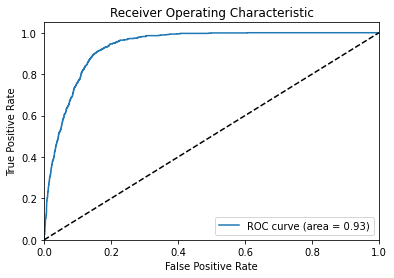

In [102]:
# Use the model to predict on the test data and compute the probability estimates for the positive class
y_prob = lg_model.predict_proba(X_test_std)[:, 1]
# compute the false positive rate (fpr) and true positive rate (tpr) at various threshold values
fpr, tpr, thresholds = roc_curve(y_test, y_prob)

# Compute the area under the ROC curve (AUC)
roc_auc = roc_auc_score(y_test, y_prob)

# Plot the ROC curve
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--') # plot the diagonal line
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

##### KNN Model

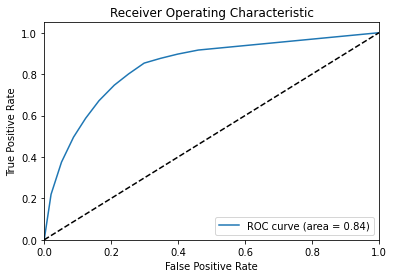

In [103]:
# use the model to predict on the test data and compute the probability estimates for the positive class
y_prob = KNN.predict_proba(X_test_std)[:, 1]

# compute the false positive rate (fpr) and true positive rate (tpr) at various threshold values
fpr, tpr, thresholds = roc_curve(y_test, y_prob)

# compute the area under the ROC curve (AUC)
roc_auc = roc_auc_score(y_test, y_prob)

# plot the ROC curve
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--') # plot the diagonal line
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

##### Decision Tree Model

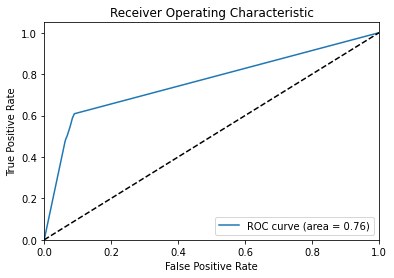

In [104]:
# use the model to predict on the test data and compute the probability estimates for the positive class
y_prob = DT_model.predict_proba(X_test_std)[:, 1]

# compute the false positive rate (fpr) and true positive rate (tpr) at various threshold values
fpr, tpr, thresholds = roc_curve(y_test, y_prob)

# compute the area under the ROC curve (AUC)
roc_auc = roc_auc_score(y_test, y_prob)

# plot the ROC curve
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--') # plot the diagonal line
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

##### XG Boost Model 

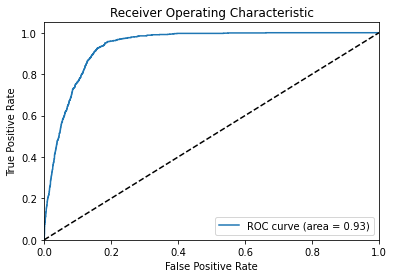

In [105]:
# use the model to predict on the test data and compute the probability estimates for the positive class
y_prob = XGB.predict_proba(X_test_std)[:, 1]

# compute the false positive rate (fpr) and true positive rate (tpr) at various threshold values
fpr, tpr, thresholds = roc_curve(y_test, y_prob)

# compute the area under the ROC curve (AUC)
roc_auc = roc_auc_score(y_test, y_prob)

# plot the ROC curve
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--') # plot the diagonal line
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

##### ADA Boost Model 

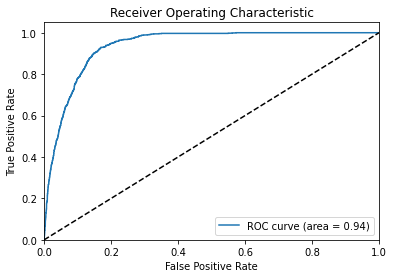

In [106]:
# use the model to predict on the test data and compute the probability estimates for the positive class
y_prob = ADA.predict_proba(X_test_std)[:, 1]

# compute the false positive rate (fpr) and true positive rate (tpr) at various threshold values
fpr, tpr, thresholds = roc_curve(y_test, y_prob)

# compute the area under the ROC curve (AUC)
roc_auc = roc_auc_score(y_test, y_prob)

# plot the ROC curve
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--') # plot the diagonal line
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

##### Gradient Boost Model 

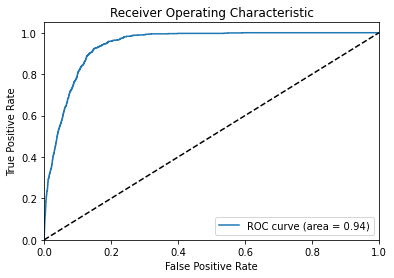

In [107]:
# use the model to predict on the test data and compute the probability estimates for the positive class
y_prob = gb_model.predict_proba(X_test_std)[:, 1]

# compute the false positive rate (fpr) and true positive rate (tpr) at various threshold values
fpr, tpr, thresholds = roc_curve(y_test, y_prob)

# compute the area under the ROC curve (AUC)
roc_auc = roc_auc_score(y_test, y_prob)

# plot the ROC curve
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--') # plot the diagonal line
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

##### Random Forests

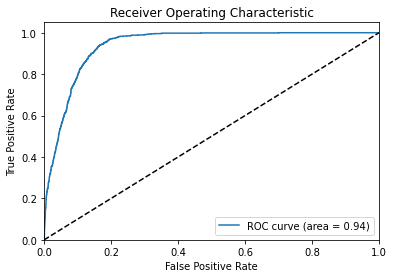

In [108]:
# use the model to predict on the test data and compute the probability estimates for the positive class
y_prob = RF_clf.predict_proba(X_test_std)[:, 1]

# compute the false positive rate (fpr) and true positive rate (tpr) at various threshold values
fpr, tpr, thresholds = roc_curve(y_test, y_prob)

# compute the area under the ROC curve (AUC)
roc_auc = roc_auc_score(y_test, y_prob)

# plot the ROC curve
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--') # plot the diagonal line
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

## B) ACCURACY, PRECISION, RECALL & F1 - SCORE

- Precision: Precision is a metric that measures the proportion of true positive predictions over all positive predictions made by the model. In other words, it measures how accurate the positive predictions are.

- Recall: Recall is a metric that measures the proportion of true positive predictions over all actual positive cases in the dataset. In other words, it measures how well the model is able to identify all positive cases.

- F1-score: F1-score is a metric that combines precision and recall into a single score. It is the harmonic mean of precision and recall, which gives equal weight to both metrics

##### Logistic Model

[[6172 1146]
 [  87  833]]


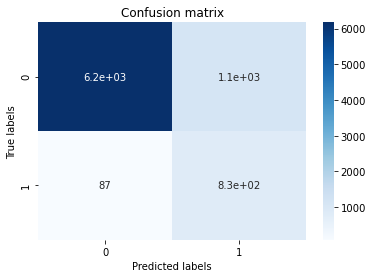

Accuracy: 0.8503277494537509
Precision: 0.42091965639211726
Recall: 0.9054347826086957
F1-Score: 0.5746809244567093


In [109]:
lg = confusion_matrix(y_test, y_pred_lg)
print(lg)

#making a heatmap
sns.heatmap(lg, annot=True, cmap='Blues')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion matrix')
plt.show()

#evaluation metrics
print('Accuracy:', accuracy_score(y_test, y_pred_lg))
print('Precision:', precision_score(y_test, y_pred_lg))
print("Recall:", recall_score(y_test, y_pred_lg))
print('F1-Score:', f1_score(y_test, y_pred_lg))

##### KNN Model

[[5786 1532]
 [ 233  687]]


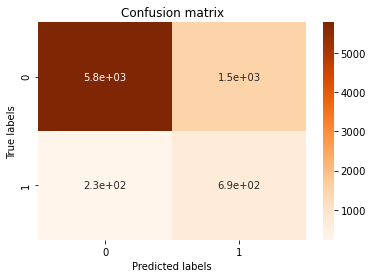

Accuracy: 0.7857489681961641
Precision: 0.309598918431726
Recall: 0.7467391304347826
F1-Score: 0.4377190187957948


In [110]:
knn = confusion_matrix(y_test, y_test_pred)
print(knn)

#making a heatmap
sns.heatmap(knn, annot=True, cmap='Oranges')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion matrix')
plt.show()

#evaluation metrics
print('Accuracy:', accuracy_score(y_test, y_test_pred))
print('Precision:', precision_score(y_test,y_test_pred))
print("Recall:", recall_score(y_test, y_test_pred))
print('F1-Score:', f1_score(y_test, y_test_pred))

##### Decision Tree Model

[[6819  499]
 [ 460  460]]


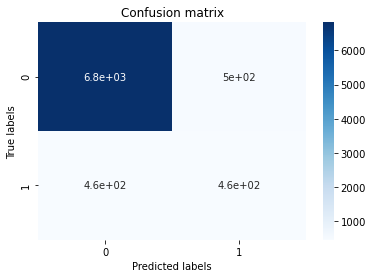

Accuracy: 0.8835882495751396
Precision: 0.4796663190823775
Recall: 0.5
F1-Score: 0.48962213943587013


In [111]:
dt = confusion_matrix(y_test, y_pred)
print(dt)

#making a heatmap
sns.heatmap(dt, annot=True, cmap='Blues')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion matrix')
plt.show()

#evaluation metrics
print('Accuracy:', accuracy_score(y_test, y_pred))
print('Precision:', precision_score(y_test, y_pred))
print("Recall:", recall_score(y_test, y_pred))
print('F1-Score:', f1_score(y_test, y_pred))

##### XG Boost Model

[[6698  620]
 [ 830   90]]


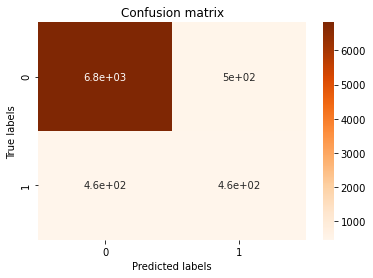

Accuracy: 0.8239864044671037
Precision: 0.1267605633802817
Recall: 0.09782608695652174
F1-Score: 0.11042944785276075


In [112]:
xgb = confusion_matrix(y_test, y_test_pred_XGB)
print(xgb)

#making a heatmap
sns.heatmap(dt, annot=True, cmap='Oranges')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion matrix')
plt.show()

#evaluation metrics
print('Accuracy:', accuracy_score(y_test, y_test_pred_XGB))
print('Precision:', precision_score(y_test, y_test_pred_XGB))
print("Recall:", recall_score(y_test, y_test_pred_XGB))
print('F1-Score:', f1_score(y_test, y_test_pred_XGB))

##### ADA Boost Model

[[4628 2690]
 [ 237  683]]


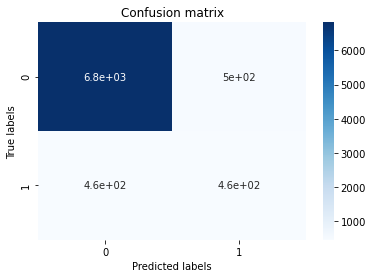

Accuracy: 0.6446953143966982
Precision: 0.20249036466053957
Recall: 0.7423913043478261
F1-Score: 0.3181924062427207


In [113]:
ada= confusion_matrix(y_test, y_test_pred_ADA)
print(ada)

#making a heatmap
sns.heatmap(dt, annot=True, cmap='Blues')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion matrix')
plt.show()

#evaluation metrics
print('Accuracy:', accuracy_score(y_test, y_test_pred_ADA))
print('Precision:', precision_score(y_test, y_test_pred_ADA))
print("Recall:", recall_score(y_test, y_test_pred_ADA))
print('F1-Score:', f1_score(y_test, y_test_pred_ADA))

##### Gradient Boost Model

[[4457 2861]
 [ 323  597]]


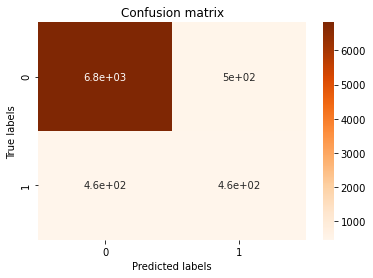

Accuracy: 0.6134984219470745
Precision: 0.17264314632735686
Recall: 0.6489130434782608
F1-Score: 0.2727272727272727


In [114]:
gb= confusion_matrix(y_test, y_test_pred_GB)
print(gb)

#making a heatmap
sns.heatmap(dt, annot=True, cmap='Oranges')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion matrix')
plt.show()

#evaluation metrics
print('Accuracy:', accuracy_score(y_test, y_test_pred_GB))
print('Precision:', precision_score(y_test, y_test_pred_GB))
print("Recall:", recall_score(y_test, y_test_pred_GB))
print('F1-Score:', f1_score(y_test, y_test_pred_GB))

##### Random Forests

[[5451 1867]
 [ 479  441]]


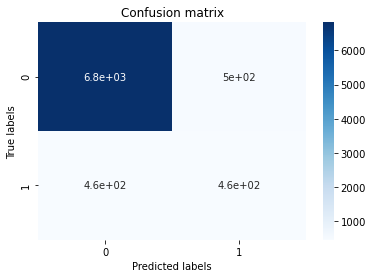

Accuracy: 0.7152221412964311
Precision: 0.1910745233968804
Recall: 0.47934782608695653
F1-Score: 0.2732342007434944


In [115]:
rf= confusion_matrix(y_test, y_pred_RF)
print(rf)

#making a heatmap
sns.heatmap(dt, annot=True, cmap='Blues')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion matrix')
plt.show()

#evaluation metrics
print('Accuracy:', accuracy_score(y_test, y_pred_RF))
print('Precision:', precision_score(y_test, y_pred_RF))
print("Recall:", recall_score(y_test, y_pred_RF))
print('F1-Score:', f1_score(y_test, y_pred_RF))

CHOOSING THE BEST MODEL

In [118]:
#!pip install prettytable
from prettytable import PrettyTable
table_model = PrettyTable()


In [119]:
table_model.field_names = ['Model_Name',"AUC_score",'Precision','f1score','recall']

In [120]:
table_model.add_row(['Logistic_Regression',0.93,0.42,0.90,0.51])
table_model.add_row(['KNN',0.84,0.30,0.74,0.43])
table_model.add_row(['Decision Tree',0.75,0.46,0.48,0.42])
table_model.add_row(['Random_Forest',0.94,0.21,0.60,0.31])
table_model.add_row(['Xgboost',0.94,0.14,0.59,0.23])
table_model.add_row(['ADA_boost',0.93,0.29,0.58,0.39])
table_model.add_row(['Gradient_boost',0.94,0.23,0.29,0.26])

In [121]:
table_model

Model_Name,AUC_score,Precision,f1score,recall
Logistic_Regression,0.93,0.42,0.9,0.51
KNN,0.84,0.3,0.74,0.43
Decision Tree,0.75,0.46,0.48,0.42
Random_Forest,0.94,0.21,0.6,0.31
Xgboost,0.94,0.14,0.59,0.23
ADA_boost,0.93,0.29,0.58,0.39
Gradient_boost,0.94,0.23,0.29,0.26


If the bank wants to minimize the cost of marketing campaigns, a model with high precision is preferred for term deposit prediction as it indicates that the model has a low rate of false positives and is more accurate in identifying customers who are likely to subscribe to a term deposit.

#### So Descision Tree is the best acccording to precision.